In [1]:
using DataFrames
using CSV
using GLM
using Statistics
using StatsPlots
using MLBase

In [2]:
ENV["COLUMNS"] = 1000

1000

In [3]:
using Pkg
Pkg.add("Pandas")
using Pandas
df = read_csv("Life_Expectancy.csv")

   Updating registry at `C:\Users\sdeo7\.julia\registries\General`
  Resolving package versions...
  Installed Pandas ─────────── v1.4.0
  Installed TableTraitsUtils ─ v1.0.1
  Installed Lazy ───────────── v0.15.1
  Installed PyCall ─────────── v1.92.3
Updating `C:\Users\sdeo7\.julia\environments\v1.5\Project.toml`
  [eadc2687] + Pandas v1.4.0
Updating `C:\Users\sdeo7\.julia\environments\v1.5\Manifest.toml`
  [50d2b5c4] + Lazy v0.15.1
  [eadc2687] + Pandas v1.4.0
  [438e738f] + PyCall v1.92.3
  [382cd787] + TableTraitsUtils v1.0.1
   Building PyCall → `C:\Users\sdeo7\.julia\packages\PyCall\BD546\deps\build.log`
┌ Info: Precompiling Pandas [eadc2687-ae89-51f9-a5d9-86b5a6373a9c]
└ @ Base loading.jl:1278
┌ Info: Installing pandas via the Conda pandas package...
└ @ PyCall C:\Users\sdeo7\.julia\packages\PyCall\BD546\src\PyCall.jl:711
┌ Info: Running `conda install -y pandas` in root environment
└ @ Conda C:\Users\sdeo7\.julia\packages\Conda\tJJuN\src\Conda.jl:128


Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\sdeo7\.julia\conda\3

  added / updated specs:
    - pandas


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    pandas-1.2.4               |   py38hd77b12b_0         7.9 MB
    python-dateutil-2.8.1      |     pyhd3eb1b0_0         221 KB
    pytz-2021.1                |     pyhd3eb1b0_0         181 KB
    ------------------------------------------------------------
                                           Total:         8.3 MB

The following NEW packages will be INSTALLED:

  pandas             pkgs/main/win-64::pandas-1.2.4-py38hd77b12b_0
  python-dateutil    pkgs/main/noarch::python-dateutil-2.8.1-pyhd3eb1b0_0
  pytz               pkgs/main/noarch::pytz-2021.1-pyhd3eb1b0_0



pytz-2021.1          | 181 KB    | ########## | 100% 
pandas-1.2.4         | 7.9 MB    | ########## | 100% 
python-date

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.000000,263.000000,62,0.010000,71.279624,65.000000,1154,19.100000,83,6.000000,8.16000,65.000000,0.1,584.259210,3.373649e+07,17.200000,17.300000,0.479000,10.100000
1,Afghanistan,2014,Developing,59.900000,271.000000,64,0.010000,73.523582,62.000000,492,18.600000,86,58.000000,8.18000,62.000000,0.1,612.696514,3.275820e+05,17.500000,17.500000,0.476000,10.000000
2,Afghanistan,2013,Developing,59.900000,268.000000,66,0.010000,73.219243,64.000000,430,18.100000,89,62.000000,8.13000,64.000000,0.1,631.744976,3.173169e+07,17.700000,17.700000,0.470000,9.900000
3,Afghanistan,2012,Developing,59.500000,272.000000,69,0.010000,78.184215,67.000000,2787,17.600000,93,67.000000,8.52000,67.000000,0.1,669.959000,3.696958e+06,17.900000,18.000000,0.463000,9.800000
4,Afghanistan,2011,Developing,59.200000,275.000000,71,0.010000,7.097109,68.000000,3013,17.200000,97,68.000000,7.87000,68.000000,0.1,63.537231,2.978599e+06,18.200000,18.200000,0.454000,9.500000
5,Afghanistan,2010,Developing,58.800000,279.000000,74,0.010000,79.679367,66.000000,1989,16.700000,102,66.000000,9.20000,66.000000,0.1,553.328940,2.883167e+06,18.400000,18.400000,0.448000,9.200000
6,Afghanistan,2009,Developing,58.600000,281.000000,77,0.010000,56.762217,63.000000,2861,16.200000,106,63.000000,9.42000,63.000000,0.1,445.893298,2.843310e+05,18.600000,18.700000,0.434000,8.900000
7,Afghanistan,2008,Developing,58.100000,287.000000,80,0.030000,25.873925,64.000000,1599,15.700000,110,64.000000,8.33000,64.000000,0.1,373.361116,2.729431e+06,18.800000,18.900000,0.433000,8.700000
8,Afghanistan,2007,Developing,57.500000,295.000000,82,0.020000,10.910156,63.000000,1141,15.200000,113,63.000000,6.73000,63.000000,0.1,369.835796,2.661679e+07,19.000000,19.100000,0.415000,8.400000
9,Afghanistan,2006,Developing,57.300000,295.000000,84,0.030000,17.171518,64.000000,1990,14.700000,116,58.000000,7.43000,58.000000,0.1,272.563770,2.589345e+06,19.200000,19.300000,0.405000,8.100000


In [6]:
Pandas.head(df)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [7]:
Pandas.tail(df)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.0,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.0,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.0,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.0,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8
2937,Zimbabwe,2000,Developing,46.0,665.0,24,1.68,0.0,79.0,1483,25.5,39,78.0,7.10,78.0,43.5,547.358879,12222251.0,11.0,11.2,0.434,9.8


In [11]:
count(df)

Country                            2938
Year                               2938
Status                             2938
Life expectancy                    2938
Adult Mortality                    2938
infant deaths                      2938
Alcohol                            2938
percentage expenditure             2938
Hepatitis B                        2938
Measles                            2938
 BMI                               2938
under-five deaths                  2938
Polio                              2938
Total expenditure                  2938
Diphtheria                         2938
 HIV/AIDS                          2938
GDP                                2938
Population                         2938
 thinness  1-19 years              2938
 thinness 5-9 years                2938
Income composition of resources    2938
Schooling                          2938
dtype: int64

In [12]:
corr(df)

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,0.169623,-0.078861,-0.037415,-0.048168,0.031400,0.089398,-0.082493,0.108327,-0.042937,0.093820,0.081860,0.133853,-0.139741,0.093351,0.014951,-0.047592,-0.050627,0.236333,0.203471
Life expectancy,0.169623,1.000000,-0.696359,-0.196535,0.391598,0.381791,0.203771,-0.157574,0.559255,-0.222503,0.461574,0.207981,0.475418,-0.556457,0.430493,-0.019638,-0.472162,-0.466629,0.692483,0.715066
Adult Mortality,-0.078861,-0.696359,1.000000,0.078747,-0.190408,-0.242814,-0.138591,0.031174,-0.381449,0.094135,-0.272694,-0.110875,-0.273014,0.523727,-0.277053,-0.012501,0.299863,0.305366,-0.440062,-0.435108
infant deaths,-0.037415,-0.196535,0.078747,1.000000,-0.113812,-0.085612,-0.178783,0.501128,-0.227220,0.996629,-0.170674,-0.126564,-0.175156,0.025231,-0.107109,0.548522,0.465590,0.471228,-0.143663,-0.191757
Alcohol,-0.048168,0.391598,-0.190408,-0.113812,1.000000,0.339634,0.075447,-0.051055,0.318070,-0.110777,0.213744,0.294898,0.215242,-0.048650,0.318591,-0.030765,-0.416946,-0.405881,0.416099,0.497546
percentage expenditure,0.031400,0.381791,-0.242814,-0.085612,0.339634,1.000000,0.011679,-0.056596,0.228537,-0.087852,0.147203,0.173414,0.143570,-0.097857,0.888140,-0.024648,-0.251190,-0.252725,0.380374,0.388105
Hepatitis B,0.089398,0.203771,-0.138591,-0.178783,0.075447,0.011679,1.000000,-0.090317,0.134929,-0.184413,0.408519,0.050084,0.499958,-0.102405,0.062318,-0.109811,-0.105144,-0.108334,0.150992,0.171755
Measles,-0.082493,-0.157574,0.031174,0.501128,-0.051055,-0.056596,-0.090317,1.000000,-0.175925,0.507809,-0.136146,-0.104569,-0.141861,0.030899,-0.068060,0.236250,0.224742,0.221007,-0.115764,-0.122609
BMI,0.108327,0.559255,-0.381449,-0.227220,0.318070,0.228537,0.134929,-0.175925,1.000000,-0.237586,0.282156,0.231814,0.281059,-0.243548,0.276645,-0.063238,-0.532025,-0.538911,0.479837,0.508105
under-five deaths,-0.042937,-0.222503,0.094135,0.996629,-0.110777,-0.087852,-0.184413,0.507809,-0.237586,1.000000,-0.188703,-0.128269,-0.195651,0.038062,-0.110640,0.535864,0.467626,0.472099,-0.161533,-0.207111


In [13]:
df = drop(df, "Country", axis = 1)

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,2015,Developing,65.000000,263.000000,62,0.010000,71.279624,65.000000,1154,19.100000,83,6.000000,8.16000,65.000000,0.1,584.259210,3.373649e+07,17.200000,17.300000,0.479000,10.100000
1,2014,Developing,59.900000,271.000000,64,0.010000,73.523582,62.000000,492,18.600000,86,58.000000,8.18000,62.000000,0.1,612.696514,3.275820e+05,17.500000,17.500000,0.476000,10.000000
2,2013,Developing,59.900000,268.000000,66,0.010000,73.219243,64.000000,430,18.100000,89,62.000000,8.13000,64.000000,0.1,631.744976,3.173169e+07,17.700000,17.700000,0.470000,9.900000
3,2012,Developing,59.500000,272.000000,69,0.010000,78.184215,67.000000,2787,17.600000,93,67.000000,8.52000,67.000000,0.1,669.959000,3.696958e+06,17.900000,18.000000,0.463000,9.800000
4,2011,Developing,59.200000,275.000000,71,0.010000,7.097109,68.000000,3013,17.200000,97,68.000000,7.87000,68.000000,0.1,63.537231,2.978599e+06,18.200000,18.200000,0.454000,9.500000
5,2010,Developing,58.800000,279.000000,74,0.010000,79.679367,66.000000,1989,16.700000,102,66.000000,9.20000,66.000000,0.1,553.328940,2.883167e+06,18.400000,18.400000,0.448000,9.200000
6,2009,Developing,58.600000,281.000000,77,0.010000,56.762217,63.000000,2861,16.200000,106,63.000000,9.42000,63.000000,0.1,445.893298,2.843310e+05,18.600000,18.700000,0.434000,8.900000
7,2008,Developing,58.100000,287.000000,80,0.030000,25.873925,64.000000,1599,15.700000,110,64.000000,8.33000,64.000000,0.1,373.361116,2.729431e+06,18.800000,18.900000,0.433000,8.700000
8,2007,Developing,57.500000,295.000000,82,0.020000,10.910156,63.000000,1141,15.200000,113,63.000000,6.73000,63.000000,0.1,369.835796,2.661679e+07,19.000000,19.100000,0.415000,8.400000
9,2006,Developing,57.300000,295.000000,84,0.030000,17.171518,64.000000,1990,14.700000,116,58.000000,7.43000,58.000000,0.1,272.563770,2.589345e+06,19.200000,19.300000,0.405000,8.100000


In [14]:
unique(df["Status"])

2-element Array{Any,1}:
 "Developing"
 "Developed"

In [15]:
df = get_dummies(df, "Status")

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status_Developed,Status_Developing
0,2015,65.000000,263.000000,62,0.010000,71.279624,65.000000,1154,19.100000,83,6.000000,8.16000,65.000000,0.1,584.259210,3.373649e+07,17.200000,17.300000,0.479000,10.100000,0,1
1,2014,59.900000,271.000000,64,0.010000,73.523582,62.000000,492,18.600000,86,58.000000,8.18000,62.000000,0.1,612.696514,3.275820e+05,17.500000,17.500000,0.476000,10.000000,0,1
2,2013,59.900000,268.000000,66,0.010000,73.219243,64.000000,430,18.100000,89,62.000000,8.13000,64.000000,0.1,631.744976,3.173169e+07,17.700000,17.700000,0.470000,9.900000,0,1
3,2012,59.500000,272.000000,69,0.010000,78.184215,67.000000,2787,17.600000,93,67.000000,8.52000,67.000000,0.1,669.959000,3.696958e+06,17.900000,18.000000,0.463000,9.800000,0,1
4,2011,59.200000,275.000000,71,0.010000,7.097109,68.000000,3013,17.200000,97,68.000000,7.87000,68.000000,0.1,63.537231,2.978599e+06,18.200000,18.200000,0.454000,9.500000,0,1
5,2010,58.800000,279.000000,74,0.010000,79.679367,66.000000,1989,16.700000,102,66.000000,9.20000,66.000000,0.1,553.328940,2.883167e+06,18.400000,18.400000,0.448000,9.200000,0,1
6,2009,58.600000,281.000000,77,0.010000,56.762217,63.000000,2861,16.200000,106,63.000000,9.42000,63.000000,0.1,445.893298,2.843310e+05,18.600000,18.700000,0.434000,8.900000,0,1
7,2008,58.100000,287.000000,80,0.030000,25.873925,64.000000,1599,15.700000,110,64.000000,8.33000,64.000000,0.1,373.361116,2.729431e+06,18.800000,18.900000,0.433000,8.700000,0,1
8,2007,57.500000,295.000000,82,0.020000,10.910156,63.000000,1141,15.200000,113,63.000000,6.73000,63.000000,0.1,369.835796,2.661679e+07,19.000000,19.100000,0.415000,8.400000,0,1
9,2006,57.300000,295.000000,84,0.030000,17.171518,64.000000,1990,14.700000,116,58.000000,7.43000,58.000000,0.1,272.563770,2.589345e+06,19.200000,19.300000,0.405000,8.100000,0,1


In [16]:
columns(df)

Index(['Year', 'Life expectancy ', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling',
       'Status_Developed', 'Status_Developing'],
      dtype='object')

In [17]:
using Pkg
Pkg.add("ScikitLearn")

  Resolving package versions...
  Installed ScikitLearnBase ─ v0.5.0
  Installed ScikitLearn ───── v0.6.2
Updating `C:\Users\sdeo7\.julia\environments\v1.5\Project.toml`
  [3646fa90] + ScikitLearn v0.6.2
Updating `C:\Users\sdeo7\.julia\environments\v1.5\Manifest.toml`
  [3646fa90] + ScikitLearn v0.6.2
  [6e75b9c4] + ScikitLearnBase v0.5.0


In [18]:
using ScikitLearn
@sk_import model_selection: train_test_split

┌ Info: Precompiling ScikitLearn [3646fa90-6ef7-5e7e-9f22-8aca16db6324]
└ @ Base loading.jl:1278
┌ Warning: Module model_selection has been ported to Julia - try `import ScikitLearn: CrossValidation` instead
└ @ ScikitLearn.Skcore C:\Users\sdeo7\.julia\packages\ScikitLearn\Kn82b\src\Skcore.jl:169
┌ Info: Installing sklearn via the Conda scikit-learn package...
└ @ PyCall C:\Users\sdeo7\.julia\packages\PyCall\BD546\src\PyCall.jl:711
┌ Info: Running `conda install -y scikit-learn` in root environment
└ @ Conda C:\Users\sdeo7\.julia\packages\Conda\tJJuN\src\Conda.jl:128


Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\sdeo7\.julia\conda\3

  added / updated specs:
    - scikit-learn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    icc_rt-2019.0.0            |       h0cc432a_1         6.0 MB
    joblib-1.0.1               |     pyhd3eb1b0_0         208 KB
    scikit-learn-0.24.1        |   py38hf11a4ad_0         4.8 MB
    scipy-1.6.2                |   py38h14eb087_0        13.0 MB
    threadpoolctl-2.1.0        |     pyh5ca1d4c_0          17 KB
    ------------------------------------------------------------
                                           Total:        24.0 MB

The following NEW packages will be INSTALLED:

  icc_rt             pkgs/main/win-64::icc_rt-2019.0.0-h0cc432a_1
  joblib             pkgs/main/noarch::joblib-1.0.1-pyhd3eb1b0_0
  scikit-learn       pkgs/main/win-64::scikit-learn-0.24.1-p

PyObject <function train_test_split at 0x000000006E388160>

In [29]:
y = df["Life expectancy "]

0       65.0
1       59.9
2       59.9
3       59.5
4       59.2
        ... 
2933    44.3
2934    44.5
2935    44.8
2936    45.3
2937    46.0
Name: Life expectancy , Length: 2938, dtype: float64

In [30]:
x = drop(df, "Life expectancy ", axis=1)

,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status_Developed,Status_Developing
0,2015,263.000000,62,0.010000,71.279624,65.000000,1154,19.100000,83,6.000000,8.16000,65.000000,0.1,584.259210,3.373649e+07,17.200000,17.300000,0.479000,10.100000,0,1
1,2014,271.000000,64,0.010000,73.523582,62.000000,492,18.600000,86,58.000000,8.18000,62.000000,0.1,612.696514,3.275820e+05,17.500000,17.500000,0.476000,10.000000,0,1
2,2013,268.000000,66,0.010000,73.219243,64.000000,430,18.100000,89,62.000000,8.13000,64.000000,0.1,631.744976,3.173169e+07,17.700000,17.700000,0.470000,9.900000,0,1
3,2012,272.000000,69,0.010000,78.184215,67.000000,2787,17.600000,93,67.000000,8.52000,67.000000,0.1,669.959000,3.696958e+06,17.900000,18.000000,0.463000,9.800000,0,1
4,2011,275.000000,71,0.010000,7.097109,68.000000,3013,17.200000,97,68.000000,7.87000,68.000000,0.1,63.537231,2.978599e+06,18.200000,18.200000,0.454000,9.500000,0,1
5,2010,279.000000,74,0.010000,79.679367,66.000000,1989,16.700000,102,66.000000,9.20000,66.000000,0.1,553.328940,2.883167e+06,18.400000,18.400000,0.448000,9.200000,0,1
6,2009,281.000000,77,0.010000,56.762217,63.000000,2861,16.200000,106,63.000000,9.42000,63.000000,0.1,445.893298,2.843310e+05,18.600000,18.700000,0.434000,8.900000,0,1
7,2008,287.000000,80,0.030000,25.873925,64.000000,1599,15.700000,110,64.000000,8.33000,64.000000,0.1,373.361116,2.729431e+06,18.800000,18.900000,0.433000,8.700000,0,1
8,2007,295.000000,82,0.020000,10.910156,63.000000,1141,15.200000,113,63.000000,6.73000,63.000000,0.1,369.835796,2.661679e+07,19.000000,19.100000,0.415000,8.400000,0,1
9,2006,295.000000,84,0.030000,17.171518,64.000000,1990,14.700000,116,58.000000,7.43000,58.000000,0.1,272.563770,2.589345e+06,19.200000,19.300000,0.405000,8.100000,0,1


In [31]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=0)

4-element Array{PyCall.PyObject,1}:
 PyObject       Year  Adult Mortality  infant deaths  Alcohol  percentage expenditure  Hepatitis B  Measles    BMI   under-five deaths   Polio  Total expenditure  Diphtheria    HIV/AIDS           GDP    Population   thinness  1-19 years   thinness 5-9 years  Income composition of resources  Schooling  Status_Developed  Status_Developing
683   2005             65.0              0    11.41             1562.520827    88.000000         1   55.3                   0   98.0               6.37         98.0        0.1  25324.486660  1.276580e+05                    0.9                  1.0                            0.826       13.5                 1                  0
478   2001            273.0             25     1.71               27.689711    80.940461      3761   12.4                  33   59.0               5.70          6.0        2.2    321.226340  1.242473e+06                   11.6                 11.8                            0.412        7.6     

In [32]:
x_train

,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status_Developed,Status_Developing
683,2005,65.0,0,11.41,1562.520827,88.000000,1,55.3,0,98.0,6.37,98.0,0.1,25324.486660,1.276580e+05,0.9,1.0,0.826,13.5,1,0
478,2001,273.0,25,1.71,27.689711,80.940461,3761,12.4,33,59.0,5.70,6.0,2.2,321.226340,1.242473e+06,11.6,11.8,0.412,7.6,0,1
2359,2001,124.0,0,10.80,196.302624,80.940461,0,51.8,0,93.0,8.57,92.0,0.1,1479.296340,1.992600e+04,2.2,2.2,0.824,14.7,1,0
971,2006,288.0,3,2.93,0.000000,95.000000,0,21.5,6,94.0,5.52,95.0,3.0,7483.158469,1.275338e+07,9.0,8.9,0.415,8.1,0,1
880,2001,225.0,0,0.01,88.629458,80.940461,0,54.3,0,94.0,4.85,94.0,0.1,4498.957270,1.388115e+06,2.4,2.5,0.781,15.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,2005,318.0,2,1.23,12.703259,80.940461,298,3.2,2,71.0,7.21,71.0,3.9,94.729749,7.832540e+05,5.9,5.8,0.396,4.0,0,1
835,2014,32.0,3,0.01,13.404774,2.000000,13,24.0,4,24.0,3.80,2.0,4.4,192.597330,1.129424e+06,8.5,8.4,0.582,9.2,0,1
1653,2013,28.0,8,0.01,8.880281,8.000000,62,29.4,12,8.0,3.63,8.0,1.1,145.578380,3.946170e+05,8.1,7.9,0.501,8.2,0,1
2607,2009,165.0,2,0.09,36.199487,72.000000,10,15.1,3,78.0,1.20,72.0,0.1,757.311444,1.922100e+04,11.6,11.6,0.599,12.1,0,1


In [33]:
x_test

,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status_Developed,Status_Developing
867,2014,122.0,0,0.010000,2700.073050,93.000000,0,59.4,0,93.0,6.38000,93.0,0.1,19941.455320,1.314545e+06,1.9,1.9,0.860,16.5,0,1
1780,2015,199.0,39,4.602861,0.000000,89.000000,6,23.8,50,89.0,5.93819,89.0,0.3,1194.591370,5.243669e+06,12.8,13.0,0.552,9.1,0,1
621,2002,424.0,9,2.550000,0.000000,80.940461,2788,2.3,14,41.0,2.45000,41.0,7.2,7483.158469,1.275338e+07,9.3,8.9,0.488,9.5,0,1
2715,2014,38.0,68,0.010000,14.167702,78.000000,314,18.1,97,82.0,7.22000,78.0,3.2,719.172669,3.883334e+07,5.7,5.6,0.483,10.0,0,1
2717,2012,339.0,73,0.010000,92.886979,78.000000,2027,17.2,109,82.0,7.58000,78.0,4.6,647.747410,3.636796e+06,5.8,5.8,0.477,10.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1290,2007,63.0,2,8.370000,5228.821581,97.000000,321,59.4,2,97.0,8.48000,97.0,0.1,37698.785730,5.843831e+06,0.5,0.5,0.862,16.1,1,0
2724,2005,446.0,99,10.090000,44.526140,64.000000,22,14.5,155,59.0,9.36000,64.0,8.7,315.788227,2.854394e+06,6.5,6.5,0.429,10.9,0,1
392,2007,157.0,1,10.890000,591.510098,95.000000,1,6.9,1,95.0,6.41000,95.0,0.1,5932.899677,7.545338e+06,2.1,2.2,0.755,13.5,1,0
27,2004,17.0,1,4.540000,221.842800,99.000000,7,48.9,1,98.0,6.38000,97.0,0.1,2416.588235,3.269390e+05,1.8,1.9,0.681,10.9,0,1


In [34]:
y_train

PyObject 683     78.7
478     58.5
2359    76.2
971     58.2
880     78.0
        ... 
763     58.6
835     57.9
1653    62.7
2607    66.6
2732    71.0
Name: Life expectancy , Length: 2350, dtype: float64

In [35]:
y_test

PyObject 867     77.3
1780    66.6
621     52.6
2715    61.5
2717    60.0
        ... 
1290    81.3
2724    53.2
392     72.6
27      73.0
674     83.0
Name: Life expectancy , Length: 588, dtype: float64

In [36]:
@sk_import linear_model: LinearRegression
model = LinearRegression().fit(x_train, y_train)

PyObject LinearRegression()

In [38]:
pred = ScikitLearn.predict(model, x_test)

588-element Array{Float64,1}:
 76.82630725197086
 65.78118221238262
 53.49083197333889
 66.7176736982922
 59.633403997540555
 61.27956030252079
 71.3713208527205
 79.0383852453491
 70.51591680807556
 47.0181938940553
 67.79732403725973
 80.19578822205618
 72.48800672138066
  ⋮
 68.40085113821695
 73.64541259647785
 65.3033792356874
 59.6280411451425
 61.125501026975144
 63.97647542830488
 74.49349580201863
 81.39578309050567
 54.75108061723091
 72.97239623224127
 73.81831857493218
 77.98565462150526

In [39]:
@sk_import metrics: r2_score

PyObject <function r2_score at 0x000000006E44E280>

In [40]:
r2_score(y_test, pred)

0.8207608535287859

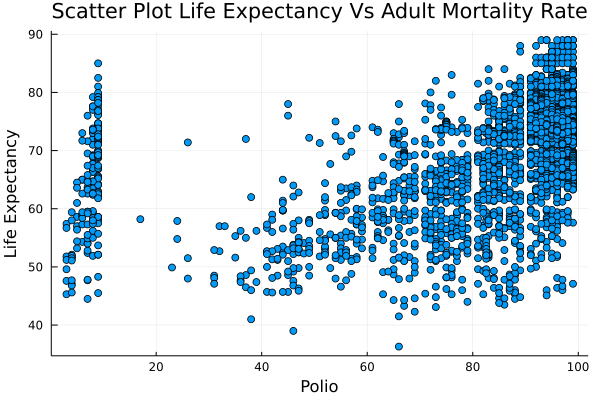

In [71]:
plot1 = scatter(Array(df["Polio"]), Array(df["Life expectancy "]), seriestype = :scatter, title = "Scatter Plot Life Expectancy Vs Adult Mortality Rate", ylabel = "Life Expectancy", xlabel = "Polio", legend = false)

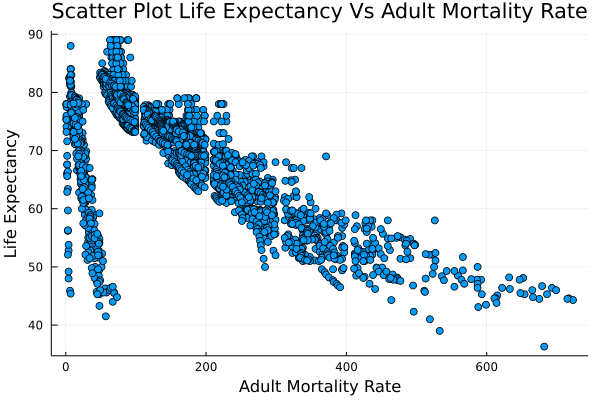

In [72]:
plot2 = scatter(Array(df["Adult Mortality"]), Array(df["Life expectancy "]), seriestype = :scatter, title = "Scatter Plot Life Expectancy Vs Adult Mortality Rate", ylabel = "Life Expectancy", xlabel = "Adult Mortality Rate", legend = false)

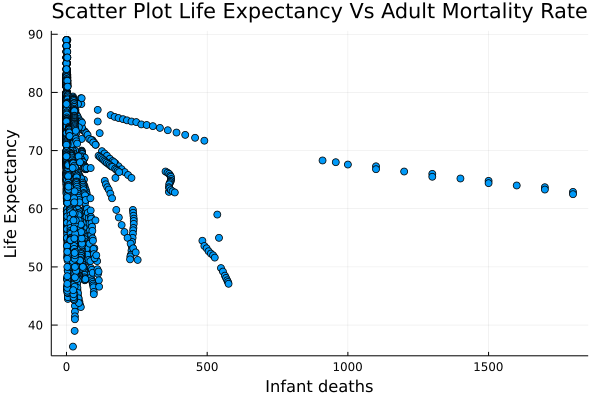

In [73]:
plot3 = scatter(Array(df["infant deaths"]), Array(df["Life expectancy "]), seriestype = :scatter, title = "Scatter Plot Life Expectancy Vs Adult Mortality Rate", ylabel = "Life Expectancy", xlabel = "Infant deaths", legend = false)